<a href="https://colab.research.google.com/github/its-emile/llm-interp-risk/blob/main/Risk_discrimination_with_TransformerLens.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a target="_blank" href="https://colab.research.google.com/github/TransformerLensOrg/TransformerLens/blob/main/demos/HookedSAETransformerDemo.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# A risk awareness circuit within transformers' hidden layers

After reading some text, what's causing a language model to quietly perceive "signals" and respond with an apparent sense of risk in the input text?

Interpretability research seeks to explain what "circuits" are sensitive to what "features" in inputs. The circuit we surface here is one that responds specifically to scenarios that carry more cybersecurity risk than similar "control" scenarios where there is very little risk.

Inspired by Neel Nanda and Connor Kissane's prior interpretability work and Anthropic & DeepMind's dictionary learning work on sparse autoencoders

# Setup
This notebook is designed to run in Colab with a TPUv2 runtime (In my testing, A100's did not provide enough memory to cache and train on a reasonable base dataset of activations, I needed 200-250 GB RAM).

In [1]:
# Janky code to do different setup when run in a Colab notebook vs VSCode
DEVELOPMENT_MODE = False
try:
    import google.colab
    IN_COLAB = True
    print("Running as a Colab notebook")
    %pip install git+https://github.com/ckkissane/TransformerLens@hooked-sae-transformer

except:
    IN_COLAB = False
    print("Running as a Jupyter notebook - intended for development only!")
    from IPython import get_ipython

    ipython = get_ipython()
    # Code to automatically update the HookedTransformer code as its edited without restarting the kernel
    ipython.magic("load_ext autoreload")
    ipython.magic("autoreload 2")

Running as a Colab notebook
  Cloning https://github.com/ckkissane/TransformerLens (to revision hooked-sae-transformer) to /tmp/pip-req-build-3gb_i5tk
  Running command git clone --filter=blob:none --quiet https://github.com/ckkissane/TransformerLens /tmp/pip-req-build-3gb_i5tk
  Running command git checkout -b hooked-sae-transformer --track origin/hooked-sae-transformer
  Switched to a new branch 'hooked-sae-transformer'
  Branch 'hooked-sae-transformer' set up to track remote branch 'hooked-sae-transformer' from 'origin'.
  Resolved https://github.com/ckkissane/TransformerLens to commit 98c2e2128828893e653de1d1169b230336c6b288
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 618.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 739.7/739.7 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.1/542.1 kB 

In [2]:
import torch
import transformer_lens.utils as utils

import plotly.express as px
import tqdm
from functools import partial
import einops
import plotly.graph_objects as go

update_layout_set = {
    "xaxis_range", "yaxis_range", "hovermode", "xaxis_title", "yaxis_title", "colorbar", "colorscale", "coloraxis",
     "title_x", "bargap", "bargroupgap", "xaxis_tickformat", "yaxis_tickformat", "title_y", "legend_title_text", "xaxis_showgrid",
     "xaxis_gridwidth", "xaxis_gridcolor", "yaxis_showgrid", "yaxis_gridwidth"
}

def imshow(tensor, renderer=None, xaxis="", yaxis="", **kwargs):
    if isinstance(tensor, list):
        tensor = torch.stack(tensor)
    kwargs_post = {k: v for k, v in kwargs.items() if k in update_layout_set}
    kwargs_pre = {k: v for k, v in kwargs.items() if k not in update_layout_set}
    if "facet_labels" in kwargs_pre:
        facet_labels = kwargs_pre.pop("facet_labels")
    else:
        facet_labels = None
    if "color_continuous_scale" not in kwargs_pre:
        kwargs_pre["color_continuous_scale"] = "RdBu"
    fig = px.imshow(utils.to_numpy(tensor), color_continuous_midpoint=0.0,labels={"x":xaxis, "y":yaxis}, **kwargs_pre).update_layout(**kwargs_post)
    if facet_labels:
        for i, label in enumerate(facet_labels):
            fig.layout.annotations[i]['text'] = label

    fig.show(renderer)

def scatter(x, y, xaxis="", yaxis="", caxis="", renderer=None, return_fig=False, **kwargs):
    x = utils.to_numpy(x)
    y = utils.to_numpy(y)
    fig = px.scatter(y=y, x=x, labels={"x":xaxis, "y":yaxis, "color":caxis}, **kwargs)
    if return_fig:
        return fig
    fig.show(renderer)

from typing import List
def show_avg_logit_diffs(x_axis: List[str], per_prompt_logit_diffs: List[torch.tensor]):


    y_data = [per_prompt_logit_diff.mean().item() for per_prompt_logit_diff in per_prompt_logit_diffs]
    error_y_data = [per_prompt_logit_diff.std().item() for per_prompt_logit_diff in per_prompt_logit_diffs]

    fig = go.Figure(data=[go.Bar(
        x=x_axis,
        y=y_data,
        error_y=dict(
            type='data',  # specifies that the actual values are given
            array=error_y_data,  # the magnitudes of the errors
            visible=True  # make error bars visible
        ),
    )])

    # Customize layout
    fig.update_layout(title_text=f'Logit Diff after Interventions',
                    xaxis_title_text='Intervention',
                    yaxis_title_text='Logit diff',
                    plot_bgcolor='white')

    # Show the figure
    fig.show()

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
torch.set_grad_enabled(False)

In [4]:
device

'cpu'

# Loading and Running the LLM

To set the context, this part starts by using Mistral-7B to merely test its native ability to respond to a risk question. We'll measure how often it can correctly determine a higher risk scenario without presenting it a comparison.

In [5]:
from transformer_lens import HookedTransformer
language_model: HookedTransformer = HookedTransformer.from_pretrained("mistralai/Mistral-7B-v0.1", use_auth_token=True).to(device)

/usr/local/lib/python3.10/dist-packages/transformers/models/auto/configuration_auto.py:919: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access pu

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/auto/auto_factory.py:468: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(


model.safetensors.index.json:   0%|          | 0.00/25.1k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.94G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.54G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/967 [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/72.0 [00:00<?, ?B/s]

Loaded pretrained model mistralai/Mistral-7B-v0.1 into HookedTransformer
Moving model to device:  cpu


A baseline for our experiments will be to compare benign vs implicitly risky scenarios. each pair is made of two very similar stories, with one deliberately presenting more cyber risk than the other.

In [91]:
# Each pair of scenarios is a [safe, risky] short story.
dataset=[["[this phone is out of battery", "this phone's software is very out of date"],
["the computer was low on battery", "the computer was left unlocked" ],
["the call came late in the evening", "the call came from an unknown caller" ],
["the teacher reviewed their homework on time", "the teacher saw that they cheated on their homework"],
["i checked my email and saw ads for shoes and a receipt for my internet bill", "i received an email invoice with a pdf attachment"],
["i clicked on the youtube video and noticed there were so many comments", "i clicked on download link and noticed an unusual popup"],
["she forgot her password and had to reset it", "she asked for help resetting her password using a different email"],
["the printer ran out of paper", "the printer started printing on its own"],
["the smart thermostat adjusted the temperature", "the smart thermostat displayed an unfamiliar control message"],
["the fitness app tracked their steps", "the fitness app requested access to contacts"],
["the tablet updated its apps automatically", "the tablet requested root permissions"],
["the online game required an update", "the online game asked for personal information"],
["the camera needed a new memory card", "the camera's LED light turned on without being used"],
["the smart speaker played music on command", "the smart speaker responded unexpectedly during a conversation"],
["the GPS showed the fastest route", "the GPS redirected to an unknown location"],
["the smart fridge added milk to the shopping list", "the smart fridge displayed a request for user login"],
["the baby monitor picked up the baby's movements", "the baby monitor had unusual audio interference"],
["the smart lightbulb changed colors with the app", "the smart lightbulb flickered to an unrecognized pattern"],
["the digital photo frame displayed vacation pictures", "the digital photo frame connected to a strange network"],
["the ebook reader downloaded a new book", "the ebook reader asked for payment information again"],
["the online banking app displayed the balance", "the online banking app logged out unexpectedly"],
["the streaming service suggested a new series", "the streaming service stopped to buffer frequently"],
["the gaming console updated automatically", "the gaming console prompted for a password reset"],
["the coffee machine signaled the brew was ready", "the coffee machine sent a calibration error"],
["the tablet automatically adjusted screen brightness", "the tablet started beeping without any interaction"],
["the smart TV displayed recommendations", "the smart TV's microphone remained active"],
["the smartwatch tracked heart rate accurately", "the smartwatch's screen flashed unexpectedly"],
["the website required a captcha verification", "the website requested a security question"],
["the e-reader synced with the library", "the e-reader asked for network sharing permission"],
["their laptop went into sleep mode", "their laptop woke up without user interaction"],
["their phone received a software update", "their phone showed a security warning after rebooting"],
["the car's GPS system showed traffic updates", "the car's GPS system requested a password"],
["the security camera recorded footage passively", "the security camera's lens moved without command"],
["the password manager suggested a strong password", "the password manager sent an unauthorized access alert"],
["the AI assistant scheduled an appointment", "the AI assistant accessed the microphone without being prompted"],
["the wearable device tracked sleep patterns", "the wearable device requested additional permissions"],
["the online payment was processed successfully", "the online payment required repeated verification steps"],
["the desktop computer started a routine scan", "the desktop computer displayed a security prompt"],
["the virtual assistant adjusted calendar entries", "the virtual assistant responded to non-existent commands"],
["the music app downloaded new songs", "the music app repeatedly crashed"],
["the smart lock confirmed the door was secured", "the smart lock's status light was flashing"],
["the weather app provided forecasts", "the weather app requested clipboard access"],
["the digital calendar synced events", "the digital calendar sent unexpected notifications"],
["the home automation system adjusted lights", "the home automation system activated without command"],
["the reading app showed recent books", "the reading app asked for phone permissions"],
["the email app filtered spam messages", "the email app displayed an authentication error"],
["the laptop screen went to screensaver mode", "the laptop screen showed a system warning message"],
["the online meeting started smoothly", "the online meeting included unexpected participants"],
["the social media app displayed friend's updates", "the social media app sent repeated login notifications"],
["the smart mirror showed daily schedule", "the smart mirror flashed error codes"],
["the tech store sent a discount notification", "the tech store sent a phishing email lookalike"],
["the car's diagnostic tool ran routine checks", "the car's diagnostic tool indicated unauthorized access"],
["the e-commerce site tracked the order history", "the e-commerce site asked for repeated login attempts"],
["the digital camera needed a firmware update", "the digital camera requested administrative permissions"],
["the email client updated mailbox automatically", "the email client requested additional authentication suddenly"],
["the smart wearable tracked exercise duration", "the smart wearable overheated during normal use"],
["the voice assistant responded to routine queries", "the voice assistant triggered by background noise"],
["the fitness band synced with the health app", "the fitness band displayed a network error"],
["the laptop's webcam switched on by user", "the laptop's webcam indicator light blinked unexpectedly"],
["the car's smart system prioritized safety alerts", "the car's smart system showed anomalous behavior"],
["the smart home app monitored energy use", "the smart home app crashed repeatedly"],
["the computer logged into the VPN", "the computer displayed security concern alert"],
["the neighbor's wifi signal is easier to use", "the neighbor's wifi doesn't require a password"],
["the phone recognized the familiar WiFi network", "the phone connected to an open WiFi network automatically"],
["the laptop finished syncing files to the cloud", "the laptop asked for re-authentication for cloud storage"],
["the smart watch tracked her daily activity", "the smart watch requested location data continuously"],
["the email app flagged suspicious messages", "the email app displayed unreadable symbols"],
["the fitness tracker paired with the smartphone", "the fitness tracker accessed the camera without prompt"],
["the smart lightbulb set the mood lighting", "the smart lightbulb connected to an unfamiliar network"],
["the family used an online recipe for dinner", "the recipe site asked for credit card details"],
["the security system sent a daily report", "the security system's camera feed lagged unexpectedly"],
["the music streaming app played their favorite songs", "the music streaming app asked for personal data intermittently"],
["the fitness app logged today's run", "the fitness app shared location data without consent"],
["the smart plug turned off the lights automatically", "the smart plug operated outside its scheduled time"],
["the e-reader displayed a new font update", "the e-reader reset to factory settings without warning"],
["the mobile browser opened a bookmarked page", "the mobile browser redirected to a different website"],
["the smart home hub coordinated devices seamlessly", "the smart home hub requested administrative access repeatedly"],
["the thermostat adjusted settings based on preferences", "the thermostat connected to an external server without consent"],
["the digital clock synchronized with the internet time", "the digital clock displayed erratic behavior suddenly"],
["the online photo album organized recent uploads", "the online photo album requested unrestricted access"],
["the tablet played a downloaded movie", "the tablet displayed an unusual battery drain warning"],
["the ebook app allowed offline reading", "the ebook app requested permissions it hadn't before"],
["the kitchen timer alerted baking completion", "the kitchen timer malfunctioned and reset unexpectedly"],
["the voice-controlled assistant answered trivia questions", "the voice-controlled assistant stored audio recordings persistently"],
["the smart TV adjusted volume based on room noise", "the smart TV's settings changed without user input"],
["the messaging app sent text messages efficiently", "the messaging app requested re-verification frequently"],
["the smartwatch notified about an incoming call", "the smartwatch tracked usage data unprompted"],
["the remote office software provided virtual backgrounds", "the remote office software requested screen recording permissions"],
["the online storage backup completed", "the online storage prompted for multiple re-entries of the password"],
["the health app integrated with wearable devices", "the health app failed to verify account ownership"],
["the smart scale measured weight and displayed the data", "the smart scale synced with foreign servers"],
["the navigation app found the optimal route", "the navigation app shared travel history unexpectedly"],
["the wristband health monitor tracked sleep cycles", "the wristband health monitor displayed system errors"],
["the electronic diary saved personal entries", "the electronic diary requested remote access"],
["the learning app tracked study progress", "the learning app requested camera access"],
["the digital assistant set reminders efficiently", "the digital assistant sent re-verification alerts"],
["the Bluetooth speaker connected to devices seamlessly", "the Bluetooth speaker paired with unidentified devices"],
["the kitchen appliance followed programmed recipes", "the kitchen appliance displayed unauthorized control messages"],
["the online grocery service tracked order history", "the online grocery service requested payment details multiple times"],
["the e-learning platform provided course notifications", "the e-learning platform displayed multiple login attempts"],
["the environmental sensor monitored air quality", "the environmental sensor transmitted excessive data"],
["the phone's flashlight feature worked as expected", "the phone's flashlight activated unexpectedly"],
["the home surveillance system recorded periodically", "the home surveillance system exhibited delayed alerts"],
["the smart vacuum mapped cleaning areas", "the smart vacuum altered its schedule randomly"],
["the smart pen digitalized handwritten notes", "the smart pen prompted for firmware updates repeatedly"],
["the digital thermostat displayed energy savings", "the digital thermostat showcased unrecognized commands"],
["the mobile banking app verified account balances", "the mobile banking app initiated unexpected logouts"],
["the smart garden system watered plants as scheduled", "the smart garden system reported network issues"],
["the cooking app provided step-by-step recipe instructions", "the cooking app crashed repeatedly"],
["the sports app monitored workout intensity", "the sports app tracked data without consent"],
["the car's rearview camera showed clear visuals", "the car's rearview camera flickered without cause"],
["the smart glasses displayed notifications discreetly", "the smart glasses collected data unduly"],
["the pet tracking app located the pet effectively", "the pet tracking app requested full access to the phone's location"],
["the baby monitor displayed clear video feed", "the baby monitor's video feed showed interference anomalies"],
["the virtual reality headset delivered immersive experiences", "the virtual reality headset requested system changes"],
["the news app provided real-time updates", "the news app sent unnecessary permissions prompts"],
["the home intercom facilitated easy communication", "the home intercom transmitted static noises"],
["the wireless charger worked efficiently", "the wireless charger exhibited overheating warnings"],
["the refrigerator suggested grocery items", "the refrigerator displayed data-sharing preferences unexpectedly"],
["the online payment system processed transactions smoothly", "the online payment system repeatedly timed out"],
["the fitness coach app provided personalized workouts", "the fitness coach app endlessly requested updates"],
["the digital photo frame displayed family photos", "the digital photo frame accessed network data without authorization"],
["the smart alarm clock woke them up with music", "the smart alarm clock switched alarms without user input"],
["the cooking timer app tracked the baking time", "the cooking timer app sent repeated notifications"],
["the online puzzle game offered daily challenges", "the online puzzle game asked for social media integration"],
["the ride-sharing app estimated travel time accurately", "the ride-sharing app requested ongoing location access"],
["the video conferencing software provided clear video", "the video conferencing software displayed network inconsistencies"],
["the tablet keyboard synced with the device", "the tablet keyboard logged keystrokes erratically"],
["the file sharing app transferred documents", "the file sharing app requested access to entire file system"],
["the navigation system updated live traffic data", "the navigation system redirected without user consent"],
["the smart goggles enhanced vision in low light", "the smart goggles recorded footage without being activated"],
["the smart switch powered appliances efficiently", "the smart switch toggled states unprompted"],
["the smart mattress tracked sleep patterns", "the smart mattress shared movement data unnecessarily"],
["the financial app showed transaction history", "the financial app prompted multiple OTP requests"],
["the smart assistant turned on the lights with voice command", "the smart assistant sent usage data externally"],
["the streaming service enabled offline views", "the streaming service requested unexpected device permissions"],
["the doorbell camera captured visitors' faces", "the doorbell camera streamed video without permission"],
["the health management app tracked habit formation", "the health management app requested access to unrelated data"],
["the social network app showed friend's updates", "the social network app sent continuous login prompts"],
["the smart front door lock confirmed it was secured", "the smart front door lock attempted multiple unauthorized logins"],
["the budgeting app categorized expenses", "the budgeting app repeatedly asked for account credentials"],
["the music player app created personalized playlists", "the music player app requested microphone access"],
["the app for journaling sent reminders regularly", "the app for journaling synced data to unknown servers"],
["the wearable device calculated exercise metrics", "the wearable device shared statistics without consent"],
["the e-reader displayed clear and vibrant text", "the e-reader prompted for unexplained firmware updates"],
["the cooking appliance followed pre-set recipes accurately", "the cooking appliance exhibited random screen error messages"],
["the TV’s parental control locked inappropriate channels", "the TV’s parental control unlocked automatically"],
["the baby monitor provided a clear audio feed", "the baby monitor's audio feed transmitted static intermittently"],
["the voice interface responded to command language", "the voice interface activated unexpectedly"],
["the video calling app allowed easy video chats", "the video calling app requested access to call history"],
["the time management app tracked productivity", "the time management app repeatedly crashed"],
["the calendar app synced with online schedules", "the calendar app requested email passwords"],
["the mobile health app recorded fitness metrics", "the mobile health app accessed unrelated apps"],
["the smart pillow tracked sleep positions", "the smart pillow sent data without consent"],
["the weather tracker app updated forecasts", "the weather tracker app downloaded unsolicited data"],
["the navigation app guided to the destination", "the navigation app stored data on external servers"],
["the e-commerce app helped in managing orders", "the e-commerce app repeatedly requested customer data"],
["the digital voice recorder captured important meetings", "the digital voice recorder activated without command"],
["the virtual pet app tracked daily interactions", "the virtual pet app malfunctioned unexpectedly"],
["the wallpaper app suggested beautiful backgrounds", "the wallpaper app redirected to external sites"],
["the smart kitchen scale measured ingredients accurately", "the smart kitchen scale sent unusual network pings"],
["the study app planned study sessions", "the study app requested access to phone records"],
["the online medical app provided doctor appointments", "the online medical app showed login inconsistencies"],
["the recipe app saved favorite recipes", "the recipe app displayed sudden ad pop-ups"],
["the photo editing app enhanced images", "the photo editing app requested unnecessary permissions"],
["the banking app showed a transaction record", "the banking app asked for private information repeatedly"],
["the expense tracker app categorized spending", "the expense tracker app exhibited irregular behavior"],
["the video game console saved game progress", "the video game console requested network permission unexpectedly"],
["the movies app allowed easy searching", "the movies app sent multiple notifications"],
["the virtual keyboard customizer worked as expected", "the virtual keyboard customizer logged keystrokes unnecessarily"],
["the smart air purifier adjusted based on air quality", "the smart air purifier sent extraneous network data"],
["the outdoor camera captured clear video", "the outdoor camera displayed unauthorized access attempts"],
["the to-do list app organized tasks efficiently", "the to-do list app demanded phone access permissions"],
["the online workout platform streamed exercise videos", "the online workout platform requested personal details multiple times"],
["the desktop computer updated system software", "the desktop computer required frequent restarts without explanation"],
["the smartwatch provided step counts", "the smartwatch requested unnecessary network permissions"],
["the smart glasses recorded video with user intention", "the smart glasses automatically uploaded content online"],
["the video doorbell malfunctioned", "the video doorbell was accessible without a password"],
["the smartphone battery lasted the whole day", "the smartphone battery displayed sudden high usage warnings"],
["the health records app tracked family health profiles", "the health records app asked for repeated authentication"],
["the wireless earbuds maintained stable connectivity", "the wireless earbuds exhibited connection to unknown devices"],
["the smart plug controlled devices remotely", "the smart plug triggered unintended power cycles"],
["the news aggregator app provided updates", "the news aggregator app accessed browser history"],
["the audiobook app played books offline", "the audiobook app prompted for permissions repeatedly"],
["the map app showed accurate locations", "the map app tracked movements continually"],
["the habit tracker helped in maintaining routines", "the habit tracker shared private routines unexpectedly"],
["the meditation app provided guided sessions", "the meditation app accessed microphone without prompt"],
["the smart gym equipment tracked workouts accurately", "the smart gym equipment asked for biometric data"],
["the translation app assisted with foreign language", "the translation app accessed clipboard data"],
["the QR code scanner worked efficiently", "the QR code scanner uploaded scans without consent"],
["the smart speaker responded to music requests", "the smart speaker engaged unsolicited interactions"],
["the reading lamp adjusted brightness automatically", "the reading lamp displayed network prompts without cause"],
["the garden sensor monitored soil moisture", "the garden sensor transmitted excessive data"],
["the food tracking app logged meals", "the food tracking app shared data with third-parties"],
["the budget planning software organized finances", "the budget planning software requested unnecessary permissions"],
["the travel app provided tour suggestions", "the travel app accessed location data continually"],
["the bluetooth headset paired swiftly", "the bluetooth headset exhibited erratic disconnections"],
["the language learning app tracked progress", "the language learning app requested permissions unexpectedly"],
["the smart ring recorded health metrics", "the smart ring shared data without user consent"],
["the document scanning app converted files", "the document scanning app requested access repeatedly"],
["the contactless payment system processed payments quickly", "the contactless payment system required multiple re-authentications"],
["the weather station displayed accurate data", "the weather station sent frequent update notifications"],
["the calendar app coordinated event schedules", "the calendar app shared data with external services"],
["the shopping list app categorized items efficiently", "the shopping list app accessed gallery unnecessarily"],
["the sleep monitor app tracked sleep effectively", "the sleep monitor app requested systematic updates"],
["the podcast app suggested new episodes", "the podcast app prompted for unrestricted permissions"]]

import random
random.shuffle(dataset)

# split dataset for training and validation
val_size = int(len(dataset)/6)
dataset_train = dataset[:-val_size]
dataset_val = dataset[-val_size:]

In [92]:
print(len(dataset_train), len(dataset_val))

172 34


# Computing risk comparisons

Let's check that the model is directionally correct in estimating a higher risk without any comparison. Initially, we'll literally include the risk question to show the model's contrasted likelihoods of predicting high vs low risk

For the purposes of this first experiment both method are using the final layer & unembed to compare tokens' logits (the unit from which the  model derives a probability for each possible token).

Either way, the comparison we draw is not a direct prediction but the evaluation of the difference in logits (~directionally, the relative likelihood)

In [93]:
# We're going to use a single story at a time to prompt for the level of risk.
prompt_format_terse = "{}. The security risk seems"

# Alternatively, we could present both versions of a story to ask which is relatively safest/riskiest (but i've not kept code here to use this variant)
prompt_format_comparison = "I experienced two different cases: A: {}\n\
Case B: {}\n\
The safest between A and B is:"
# List of prompts
prompts = []
# List of answers, in the format (correct, incorrect)
answers = []
# List of the token (ie an integer) corresponding to each answer, in the format (correct_token, incorrect_token)
answer_tokens = []

import random

for i in range(len(dataset_val)):
    k = random.randint(0,1) #randomize stories. this isn't especially valuable if we test both orders in every case, which I ended up doing.
    k=0 # unrandomized to simplify accuracy computation with terse approach
    for j in range(2): #
        stories = ((dataset_val[i][k^j], dataset_val[i][1 - k^j]))
        answer_comparison = ("A","B") if k^j==0 else ("B","A")
        answer_terse = ("low","high") if k^j==0 else ("high","low")
        answer = answer_terse # must match the prompt format below
        answers.append(answer) # which is safest?
        answer_tokens.append(
            (
                language_model.to_single_token(answers[-1][0]),
                language_model.to_single_token(answers[-1][1]),
            )
        )
        prompt_format = prompt_format_terse # must match the answers shape above
        prompts.append(prompt_format.format(*stories))
answer_tokens = torch.tensor(answer_tokens).to(device)
print(prompts)
print(answers)

['the smart fridge added milk to the shopping list. The security risk seems', 'the smart fridge displayed a request for user login. The security risk seems', 'the mobile browser opened a bookmarked page. The security risk seems', 'the mobile browser redirected to a different website. The security risk seems', 'the news app provided real-time updates. The security risk seems', 'the news app sent unnecessary permissions prompts. The security risk seems', 'the health records app tracked family health profiles. The security risk seems', 'the health records app asked for repeated authentication. The security risk seems', 'the kitchen timer alerted baking completion. The security risk seems', 'the kitchen timer malfunctioned and reset unexpectedly. The security risk seems', 'the thermostat adjusted settings based on preferences. The security risk seems', 'the thermostat connected to an external server without consent. The security risk seems', 'the shopping list app categorized items efficie

# Measure the language model's potential discriminating accuracy

In [94]:
def logits_to_ave_logit_diff(logits, answer_tokens, per_prompt=False):
    # Only the final logits are relevant for the answer
    final_logits = logits[:, -1, :]
    answer_logits = final_logits.gather(dim=-1, index=answer_tokens)
    answer_logit_diff = answer_logits[:, 0] - answer_logits[:, 1]
    if per_prompt:
        return answer_logit_diff
    else:
        return answer_logit_diff.mean()

tokens = language_model.to_tokens(prompts, prepend_bos=True)
original_logits, cache = language_model.run_with_cache(tokens)
original_average_logit_diff = logits_to_ave_logit_diff(original_logits, answer_tokens)
print(f"Original average logit diff: {original_average_logit_diff} (a positive bias or at least nonzero should show discrimination favoring the first column)")
original_per_prompt_logit_diff = logits_to_ave_logit_diff(original_logits, answer_tokens, per_prompt=True)
print(f"Original per prompt logit diff: {original_per_prompt_logit_diff}")

Original average logit diff: 0.11326427757740021 (a positive bias or at least nonzero should show discrimination favoring the first column)
Original per prompt logit diff: tensor([ 1.0048, -0.8669,  1.1850, -0.8595,  1.1281, -1.1998,  1.1806, -1.0529,
         1.2605, -0.8337,  1.3270, -1.3220,  1.6217, -1.1485,  1.4319, -1.2662,
         1.3865, -0.7735,  1.2599, -1.1173,  1.3392, -1.2505,  0.5618, -0.4474,
         1.0675, -1.0057,  1.4482, -1.2777,  1.0080, -1.1553,  1.1240, -0.5067,
         0.9569, -1.2140,  1.1252, -0.0506,  1.2873, -1.1027,  0.3417, -0.0917,
         1.0940, -1.2783,  1.4923, -1.2300,  0.8131, -1.1472,  1.3909, -1.1212,
         0.8207,  0.1226,  1.4765, -1.6304,  0.9344, -1.4840,  1.5045, -0.8145,
         1.4751, -1.2145,  1.4299, -0.8038,  1.3521, -0.9472,  1.3196, -0.6670,
         1.7048, -1.1956,  1.2718, -1.4702], grad_fn=<SubBackward0>)


In [95]:
# Compute accuracy of the model's output logits by comparing the logit diffs between both runs each time.
safe_tests_logit_diff = original_per_prompt_logit_diff[::2]
risky_tests_logit_diff = original_per_prompt_logit_diff[1::2] # the negative tests are interlaced.
# on average (sum per example), is the model directionally correct (showing a larger correct logit diff than incorrect logit diff)?
accuracy=torch.gt(safe_tests_logit_diff+risky_tests_logit_diff, 0).float().mean()
print("Accuracy:",accuracy)
# no split of precision and recall because so far we have the same number of risky and safe entries under evaluation.

torch.Size([68])
Accuracy: tensor(0.7647)


In [96]:
!pip install git+https://github.com/neelnanda-io/Transformer_Lens

  Cloning https://github.com/neelnanda-io/Transformer_Lens to /tmp/pip-req-build-93w1tubx
  Running command git clone --filter=blob:none --quiet https://github.com/neelnanda-io/Transformer_Lens /tmp/pip-req-build-93w1tubx
  fatal: could not read Username for 'https://github.com': No such device or address
  error: subprocess-exited-with-error
  
  × git clone --filter=blob:none --quiet https://github.com/neelnanda-io/Transformer_Lens /tmp/pip-req-build-93w1tubx did not run successfully.
  │ exit code: 128
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× git clone --filter=blob:none --quiet https://github.com/neelnanda-io/Transformer_Lens /tmp/pip-req-build-93w1tubx did not run successfully.
│ exit code: 128
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


# Visualize the sensitivity

Across all layers/dimensions in the activation space, let's visualize where activations show a sensitivity to the "risk gap" between prompt pairs as average of the difference between the prompts

In [97]:
act_diffs_all=torch.zeros(31,cache[f"blocks.0.mlp.hook_post"].size(2)).to(device)
for L in range(31):
  act_diffs=torch.zeros(cache[f"blocks.0.mlp.hook_post"].size(2)).to(device)
  for i in range(20):
    act_diffs+=cache[f"blocks.{L}.mlp.hook_post"][2*i+1][-1]-cache[f"blocks.{L}.mlp.hook_post"][2*i][-1]
  act_diffs/=20
  act_diffs_all[L]=act_diffs.cpu()

In [98]:
import plotly.express as px
import numpy as np
import transformer_lens
from transformer_lens.utils import to_numpy

def imshow(tensor, yaxis="", xaxis="", **kwargs):
    tensor = to_numpy(tensor)
    plot_kwargs = {"color_continuous_scale":"RdBu", "color_continuous_midpoint":0.0, "labels":{"x":xaxis, "y":yaxis},"aspect":"auto"}
    plot_kwargs.update(kwargs)
    px.imshow(tensor, **plot_kwargs).show()

In [99]:
act_diffs_all.size()

torch.Size([31, 14336])

In [100]:
imshow(act_diffs_all,"Layer","dimension")

We can see some layers carry sensitivity to the difference between the safe and risky scenario, some of which are more sparse.

# Let's find the most sensitive neurons

The neurons above are still polysemantic: when the model is aware of risk, it's not represented by one but many neurons activating.

So we need to build a "feature" detector to distill the model's latent discriminatory ability.

A sparse autoencoder is good to find lots of learned features, IF we have a lot of training data for dictionary learning. Here, we have clearly labeled data but not a comprehensive dictionary, only particular use cawes.

Can we still train a simpler regularized MLP to isolate the most sensitive neuron combinations from each layer?

With the full training dataset (in batches) let's train simple MLP classifiers on the activations from layers 20-30 and compare their accuracy.

For the classifier that I'll train, inputs won't have risk-related prompts anymore, only the unvarnished scenarios.

In [101]:
# free memory
import gc
del tokens
del prompts
del answers
del act_diffs_all
del original_logits
del original_per_prompt_logit_diff
del original_average_logit_diff
del answer_tokens

# Force garbage collection
gc.collect()


51903

In [138]:
# tokenize all inputs for LLM processing (training + validation datasets)
dataset_train_flat=[]
dataset_val_flat=[]
for x in dataset_train:
  dataset_train_flat.append(x[0])
  dataset_train_flat.append(x[1])

for x in dataset_val:
  dataset_val_flat.append(x[0])
  dataset_val_flat.append(x[1])
dtrain = torch.utils.data.TensorDataset(language_model.to_tokens(dataset_train_flat))
dval = torch.utils.data.TensorDataset(language_model.to_tokens(dataset_val_flat))
print(len(dtrain),len(dval))

344 68


In [139]:
from torch.utils.data import DataLoader, TensorDataset

def run_with_partial_cache(model, inputs, layers_to_cache=None):
    """
    Run the model and cache activations only for specified layers.

    Args:
    - model: The transformer model.
    - inputs: The inputs to the model.
    - layers_to_cache: A list of layer indices to cache.

    Returns:
    - cache: A dictionary of cached activations for specified layers.
    """
    cache = {}

    def act_cache_hook(x, hook):
      cache[hook.name] = x.detach().to('cpu')

    # prepare hooks
    hook_list = [(f"blocks.{layer_to_cache}.mlp.hook_post",act_cache_hook) for layer_to_cache in layers_to_cache]

    # Run the model
    outputs = model.run_with_hooks(inputs,fwd_hooks=hook_list)

    # Remove hooks
    model.reset_hooks()

    return cache

# layers of interest for next two cells' transformer activations (with cache)
layers_selected = range(20,31)  # Layers 20 to 30. I later realized layer 19 also seems to carry a visible activation difference, but haven't expanded the exploration to cover it yet.

In [140]:
# run tokenized inputs through language_model while caching activations for the selected layers
cache_train = {}
for batch, inputs in enumerate(DataLoader(dtrain, batch_size=1, shuffle=False)):
  print(batch/len(dtrain))
  # get activations and append them to the multi layer cache
  c = run_with_partial_cache(language_model,inputs[0], layers_selected)
  for L in layers_selected:
    if L not in cache_train:
      cache_train[L] = []
    cache_train[L].append(c[f"blocks.{L}.mlp.hook_post"])

0.0
0.0029069767441860465
0.005813953488372093
0.00872093023255814
0.011627906976744186
0.014534883720930232
0.01744186046511628
0.020348837209302327
0.023255813953488372
0.02616279069767442
0.029069767441860465
0.03197674418604651
0.03488372093023256
0.0377906976744186
0.040697674418604654
0.0436046511627907
0.046511627906976744
0.04941860465116279
0.05232558139534884
0.055232558139534885
0.05813953488372093
0.061046511627906974
0.06395348837209303
0.06686046511627906
0.06976744186046512
0.07267441860465117
0.0755813953488372
0.07848837209302326
0.08139534883720931
0.08430232558139535
0.0872093023255814
0.09011627906976744
0.09302325581395349
0.09593023255813954
0.09883720930232558
0.10174418604651163
0.10465116279069768
0.10755813953488372
0.11046511627906977
0.11337209302325581
0.11627906976744186
0.11918604651162791
0.12209302325581395
0.125
0.12790697674418605
0.1308139534883721
0.13372093023255813
0.13662790697674418
0.13953488372093023
0.14244186046511628
0.14534883720930233
0.1

In [141]:
cache_val = {}
for batch, inputs in enumerate(DataLoader(dval, batch_size=1, shuffle=False)):
  print(batch/len(dval))
  # get activations and append them to the multi layer cache
  c = run_with_partial_cache(language_model,inputs[0], layers_selected)
  for L in layers_selected:
    if L not in cache_val:
      cache_val[L] = []
    cache_val[L].append(c[f"blocks.{L}.mlp.hook_post"])

0.0
0.014705882352941176
0.029411764705882353
0.04411764705882353
0.058823529411764705
0.07352941176470588
0.08823529411764706
0.10294117647058823
0.11764705882352941
0.1323529411764706
0.14705882352941177
0.16176470588235295
0.17647058823529413
0.19117647058823528
0.20588235294117646
0.22058823529411764
0.23529411764705882
0.25
0.2647058823529412
0.27941176470588236
0.29411764705882354
0.3088235294117647
0.3235294117647059
0.3382352941176471
0.35294117647058826
0.36764705882352944
0.38235294117647056
0.39705882352941174
0.4117647058823529
0.4264705882352941
0.4411764705882353
0.45588235294117646
0.47058823529411764
0.4852941176470588
0.5
0.5147058823529411
0.5294117647058824
0.5441176470588235
0.5588235294117647
0.5735294117647058
0.5882352941176471
0.6029411764705882
0.6176470588235294
0.6323529411764706
0.6470588235294118
0.6617647058823529
0.6764705882352942
0.6911764705882353
0.7058823529411765
0.7205882352941176
0.7352941176470589
0.75
0.7647058823529411
0.7794117647058824
0.7941

In [143]:
class MyDataSet(torch.utils.data.Dataset):
  def __init__(self, x, y):
    super(MyDataSet, self).__init__()
    # store the raw tensors
    self._x = x
    self._y = y

  def __len__(self):
    # a DataSet must know it size
    return len(self._x)

  def __getitem__(self, index):
    x = self._x[index]
    y = self._y[index]
    return x, y

Layer 20 training starting
Layer 20 Epoch [1/50], Loss: Training = 0.2661, Validation = 0.1617
Layer 20 Epoch [2/50], Loss: Training = 0.2518, Validation = 0.0980
Layer 20 Epoch [3/50], Loss: Training = 0.2284, Validation = 0.0558
Layer 20 Epoch [4/50], Loss: Training = 0.2075, Validation = 0.0304
Layer 20 Epoch [5/50], Loss: Training = 0.1884, Validation = 0.0158
Layer 20 Epoch [6/50], Loss: Training = 0.1709, Validation = 0.0078
Layer 20 Epoch [7/50], Loss: Training = 0.1547, Validation = 0.0042
Layer 20 Epoch [8/50], Loss: Training = 0.1404, Validation = 0.0037
Layer 20 Epoch [9/50], Loss: Training = 0.1283, Validation = 0.0053
Layer 20 Epoch [10/50], Loss: Training = 0.1177, Validation = 0.0084
Layer 20 Epoch [11/50], Loss: Training = 0.1085, Validation = 0.0124
Layer 20 Epoch [12/50], Loss: Training = 0.1006, Validation = 0.0169
Layer 20 Epoch [13/50], Loss: Training = 0.0938, Validation = 0.0217
Layer 20 Epoch [14/50], Loss: Training = 0.0880, Validation = 0.0267
Layer 20 Epoch [

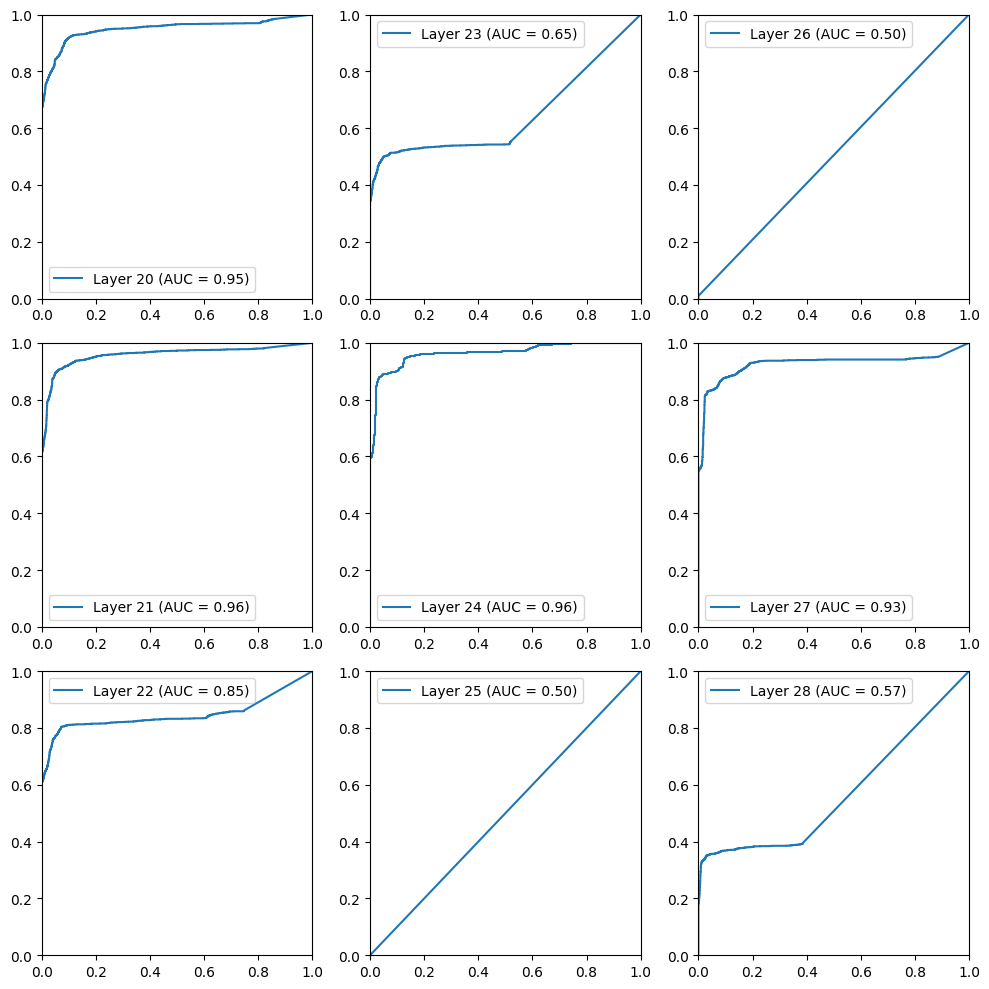

In [170]:

import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import f1_score

torch.set_grad_enabled(True)

losses_t = []
losses_v = []
models=[]
models_th_f1_fp_tp=[]
def loss_fn(input, target):
  criterion = nn.MSELoss()
  reg = 0
  for p in model.parameters():
    reg += torch.norm(p) ** 2
  return criterion(input, target)+reg * 0.001


# initialize ROC analysis
from sklearn.metrics import roc_curve, auc
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10))
plot_idx = 0

for L in layers_selected:

  print(f"Layer {L} training starting")
  model = nn.Sequential(
    nn.Linear(14336, 1),
    nn.ReLU()
  ).to('cpu')

  torch.nn.init.xavier_uniform_(model[0].weight)

  # Create the TensorDataset using the list of tensors
  # OLD: cache_val[10]['blocks.27.mlp.hook_post'][0][-1].size()
  # NEW: cache_train[Layers][Data samples][0][-1])
  acts_train = [cache_train[L][i][0][-1] for i in range(len(cache_train[L]))] # OLD: [cache_train[L][i][f"blocks.{L}.mlp.hook_post"][0][-1] for i in range(len(cache_train[L]))]
  acts_val = [cache_val[L][i][0][-1] for i in range(len(cache_val[L]))] # OLD: [cache_val[L][i][f"blocks.{L}.mlp.hook_post"][0][-1] for i in range(len(cache_val[L]))]
  labels_train = torch.tensor([float(i) % 2 for i in range(len(dataset_train_flat)*2)]).to('cpu').unsqueeze(1)
  labels_val = torch.tensor([float(i) % 2 for i in range(len(dataset_val_flat)*2)]).to('cpu').unsqueeze(1)

  train_dataset = MyDataSet(acts_train, labels_train)
  val_dataset = MyDataSet(acts_val, labels_val)

  train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)
  val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

  # Initialize the model, loss function, and optimizer
  optimizer = optim.Adam(model.parameters(), lr=1e-4)
  model.train(True)
  # initialize ROC analysis
  predictions = []
  true_labels = []

  # Classifier training loop
  num_epochs = 50 # early stopping based on experience, as the models can overfit activations (eroding validation after that)
  for epoch in range(num_epochs):
    for batch, (inputs, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(inputs)
        #print(torch.norm(inputs[0]), labels, outputs)
        loss_t = loss_fn(outputs, labels)
        loss_t.backward()
        optimizer.step()
    for batch, (inputs, labels) in enumerate(val_loader):
        # prepare for loss analysis
        outputs = model(inputs)
        loss_v = loss_fn(outputs, labels)
        # prepare for ROC:
        predictions.append(outputs.item())
        true_labels.append(labels.item())
    print(f'Layer {L} Epoch [{epoch+1}/{num_epochs}], Loss: Training = {loss_t.item():.4f}, Validation = {loss_v.item():.4f}')
  losses_t.append(loss_t.item())
  losses_v.append(loss_v.item())

  # preserve layer model
  models.append(model)
  # Calculate the ROC curve and AUC
  fpr, tpr, thresholds = roc_curve(true_labels, predictions)
  roc_auc = auc(fpr, tpr)

  # Calculate the F1 score for each threshold
  f1_scores = [f1_score(true_labels, predictions > threshold, average='macro') for threshold in thresholds]
  # Find the threshold that maximizes the F1 score
  optimal_threshold = thresholds[np.argmax(f1_scores)]

  # Calculate the optimal F1 score
  optimal_f1 = f1_scores[np.argmax(f1_scores)]
  models_th_f1_fp_tp.append((optimal_threshold, optimal_f1, fpr[np.argmax(f1_scores)], tpr[np.argmax(f1_scores)]))

  # Print the optimal threshold and F1 score
  print(f"L{L} Optimal threshold/F1 score/FPR/TPR: {optimal_threshold} --> {optimal_f1}/{fpr[np.argmax(f1_scores)]}/{tpr[np.argmax(f1_scores)]}")

  if plot_idx < 9:
    # Plot the ROC curve
    i = plot_idx % 3
    j = int(plot_idx / 3)
    axes[i,j].plot(fpr, tpr, label=f'Layer {L} (AUC = {roc_auc:.2f})')
    axes[i,j].set_xlim([0,1])
    axes[i,j].set_ylim([0,1])
    axes[i,j].legend()
    plot_idx += 1

plt.tight_layout()
plt.show()


# More visualizations of sensitivity to "cyber risk" in the language model's layers
Sensitivity to risk varies by layer. The language model's activations do carry some differentiation that could lead to treating the text with "awareness" and an "expectation" of what might happen, i.e. "recognized features of the input text" if these activations influence the layer's output.

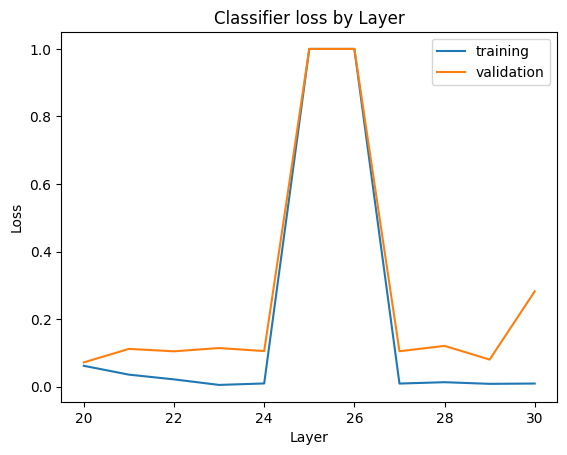

In [171]:
# visualize loss by layer on chart
import matplotlib.pyplot as plt
plt.title(f'Classifier loss by Layer')
plt.xlabel('Layer')
plt.ylabel('Loss')
plt.plot(layers_selected,losses_t, label="training")
plt.plot(layers_selected,losses_v, label="validation")
plt.legend()
plt.show()

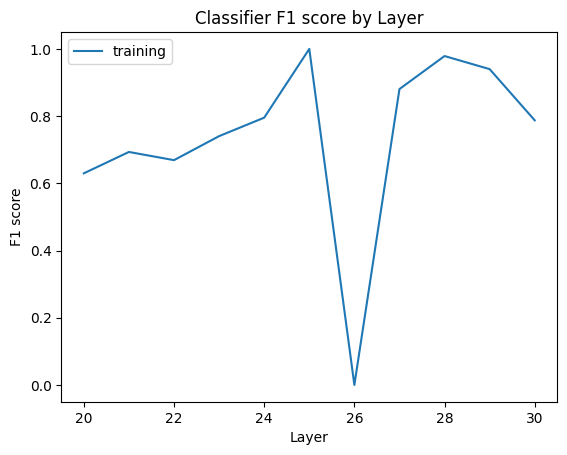

In [172]:
# visualize f1 score by layer on chart
f1, th, fp, tp = zip(*models_th_f1_fp_tp)

import matplotlib.pyplot as plt
plt.title(f'Classifier F1 score by Layer')
plt.xlabel('Layer')
plt.ylabel('F1 score')
plt.plot(layers_selected,f1, label="training")
plt.legend()
plt.show()

# identify the largest classifier weights in sensitive layers
Remember, the classifiers we built are different from the weights in the language model, but their most significant factors can help us look for neurons for further study directly in the model (e.g. with attention masks)

In [181]:

weights=[]
for L in layers_selected:
  weights.append(models[L-layers_selected[0]].state_dict()['0.weight'])

largest_weights = []
for i in range(5,9): # based on loss chart, sensitive layers are 25-28
  for j in range(len(weights[i][0])):
    largest_weights.append((i, j, weights[i][0][j]))

largest_weights.sort(key=lambda x: x[2], reverse=True)

for x in largest_weights[:20]: # these are the language model hidden activations (layer.mlp_dim) most correlated to risk awareness.
  print(f"{x[0]+layers_selected[0]}.{x[1]}")

27.11374
27.4850
27.8703
27.3860
27.1885
27.13632
27.4569
27.8424
27.8199
27.9572
27.8722
27.13589
27.11870
27.5795
27.5264
27.851
27.4576
27.9935
27.5949
27.11050


 # How does this sensitivity influence outputs?

Let's compare what happens when these sensitive neurons fire vs don't. What do output changes look like?

 This analysis is to ablate (artificially trigger / inhibit triggers) on the activations we've identified (correlated to cyber risks), observing token logit differences.

In [183]:
# To run the ablation with human readable results, let's re-use our initial strategy of sampling outputs based on direct prompts to the model
a1_prompt_suffixes = [". I'm concerned that",". I notice here that", ". That carries a risk that", ". When I saw that, I thought"]
inputs_a1 = [input_b + suf for (input_a, input_b) in dataset_val for suf in a1_prompt_suffixes ] # we'll ablate only in the risky scenarios where material in the input can be used or ignored.
a1_tokens = language_model.to_tokens(inputs_a1)
last_idx = torch.sum(a1_tokens!=2,dim=1)-1
indices = last_idx.unsqueeze(1).unsqueeze(2).expand(-1, -1, 32000)

# we'll run all inputs with an ablation/patching hook forcing activation to 0 or 1 for each of the identified neurons.
for w in largest_weights[:20]:
  def hook_clamp_0(x, hook):
    x[:,:,w[1]] = 0
    return x


  def hook_clamp_1(x, hook):
    x[:,:,w[1]] = 1
    return x

  # for each of these we'll force an activation vs inactivation and compare.
  a1_logits_0 = language_model.run_with_hooks(language_model.to_tokens(inputs_a1),fwd_hooks=[(utils.get_act_name("pre",w[0]),hook_clamp_0)])
  a1_logits_1 = language_model.run_with_hooks(language_model.to_tokens(inputs_a1),fwd_hooks=[(utils.get_act_name("pre",w[0]),hook_clamp_1)])

  # find logits with the largest average increase across all input samples
  logit_diffs = torch.gather(a1_logits_1, 1, indices)[:,0] - torch.gather(a1_logits_0, 1, indices)[:,0]

  (values, ids) = torch.topk(torch.mean(logit_diffs, dim=0), 5)

  print(f"Activations on neuron {w[0]}.{w[1]} increase likelihood of", [language_model.tokenizer.decode(id) for id in ids])

# sample tokens with probabilities increased when our selected neurons fire: issues/concerns/viruses/Malware, stealing/crime/attacks, likelihood words, programming words and injection patterns, MS Windows, (also some political figures and terms related to Germany)

Activations on neuron 7.11374 increase likelihood of ['.', 'issue', 'issue', 'sucks', 'meant']
Activations on neuron 7.4850 increase likelihood of ['Shah', 'Wallace', 'Light', 'Moon', 'Deep']
Activations on neuron 7.8703 increase likelihood of ['lately', 'practically', 'hardly', 'words', 'majority']
Activations on neuron 7.3860 increase likelihood of ['/******/', 'nothing', 'ignore', 'ignored', 'refuse']
Activations on neuron 7.1885 increase likelihood of ['Harvey', 'Virgin', 'Hillary', 'Rogers', 'Peg']
Activations on neuron 7.13632 increase likelihood of ['trump', 'Trump', 'hasn', 'Donald', 'hadn']
Activations on neuron 7.4569 increase likelihood of ['maybe', 'wasn', 'others', 'shouldn', 'hasn']
Activations on neuron 7.8424 increase likelihood of ['definitely', 'probably', 'certainly', 'Indians', 'somebody']
Activations on neuron 7.8199 increase likelihood of ['folks', 'Microsoft', 'whatever', 'hasn', 'isn']
Activations on neuron 7.9572 increase likelihood of ['Kyle', 'Jay', 'Brad', '

In [184]:
dval

# To what are these activations actually sensitive?
Knowing that these activations are correlated to risk awareness, and what the model predicts it might say about that doesn't quite explain the logic of the circuit. To understand the cyber risk awareness circuit will require tracing back activations to input text that influence their triggers.

This section will initially analyze the attention mask

In [ ]:
cache_attn = {}
for batch, inputs in enumerate(DataLoader(dtrain, batch_size=1, shuffle=False)):
  print(batch/len(dtrain))
  # get activations and append them to the multi layer cache
  logits, lang_cache = language_model.run_with_cache(inputs[0], remove_batch_dim=True)
  for L in layers_selected:
    if L not in cache_attn:
      cache_attn[L] = []
    cache_attn[L].append(lang_cache[utils.get_act_name("attn",L)])


In [ ]:
!pip install circuitsvis
import circuitsvis as cv


In [ ]:
cv.attention.attention_patterns(tokens=np.array(inputs), attention=np.array(cache_attn[20]))

# i have difficulties getting that to work
# I might instead isolate the tokens on which our sensitive neurons have fired, and use the attention mask then (by hand) to highlight the influence of preceding tokens


# Future work

Visualize activations not at the end of an input but throughout, to search for snap intermediate triggers vs ultimate state.

A linear or 5 point risk scale instead of binary classification

Transformer models’ MLP outputs all work with the same data as my linear probe, so we're interested to find which embedding dimensions have weights correlated highly to the ones learned by the linear probes.